In [1]:
import numpy as np
import matplotlib.pyplot as plt
from matplotlib.animation import FuncAnimation
from matplotlib.patches import Circle, Rectangle
from IPython.display import HTML

# Motion data
t = np.linspace(0, 10, 200)
k=40

#omega=np.sqrt(k/m)
A=1
v_bullet=3
x_bullet=v_bullet*t
x_bullet_spring_M=10-x_bullet
x_mass_M = 5*np.ones_like(t) #*A*np.sin(omega*t)/(A*np.sin(omega*t))
t1=t
x_bullet=10*np.ones_like(len(t))
#x_mass_M =5*np.ones_like(len(t))


def x_bullet_M(v_bullet,s):
    x_bullet_M1=[]
    for i in range(len(t)):
        if i>s:
            x_bullet_M1.append(10-v_bullet*(t[i]-t[s]))
        else:
            x_bullet_M1.append(10)
    return np.array(x_bullet_M1)
t1=t
def x_mass(m1,m2, r1,r2,t,x_mass,x_bullet_spring,col_index_M):
    x_mass_m=x_mass
    x_bullet_spring_m=x_bullet_spring
    v2=np.gradient(x_bullet_spring_m, t)
    v1=np.gradient(x_mass_m,t)
    v1=np.nan_to_num(v1,nan=0)
    x_bullet_spring=[]
    collison_t=[]
    m1=m1
    m2=m2
    collision_indeces=[col_index_M]

    for i in range(len(t)):
        if (col_index_M<=i) & (abs(x_bullet_spring_m[i]-x_mass_m[i])<=(r1+r2)) :
            collison=t[i]
            collison_t.append(collison)
            collision_indeces.append(i)
            col_index=collision_indeces[1]
            collision_indeces[0]=col_index
            #col_difference=x_bullet_spring_m-x_mass_m
            #col_index=np.argmin(abs(col_difference))
            V=(m1*v1[col_index]+m2*v2[col_index])/(m1+m2)
            delta_x=np.sqrt(((m1+m2))/k)*V

            omega_modified=np.sqrt(k/(m1+m2))
            deltax=5-x_mass_m[col_index]
            A_modified=np.sqrt(deltax**2+V*V/(omega_modified)**2)
            phi=np.arctan2(-V,omega_modified*deltax)

            for i in range(len(t)):
                if t[i]>t[col_index]:
                   x_bullet_spring_m[i]=5 + A_modified*np.cos(omega_modified*(t[i]-t[col_index])+ phi) #*np.exp(-0.05*(t[i]-t[col_index]))
                   x_mass_m[i]=5 +A_modified*np.cos(omega_modified*(t[i]-t[col_index])+ phi)#*np.exp(-0.05*(t[i]-t[col_index]))
    return m1+m2,m2, t,np.array(x_mass_m),np.array(x_bullet_spring_m),collision_indeces[0]

def x_bullet(x_bullet_spring1,x_bullet_spring2,col_index2):
   x_bullet_spring1[col_index2:]=x_bullet_spring2[col_index2:]
   return x_bullet_spring1,x_bullet_spring2


r=np.array([0, 0.3,0.26, 0.24,0.22,0.20,0.16,0.12, 0.11, 0,10, 0.9, 0.8,0.7])
m=20*r**3
t_trigger=np.array(([0,0,10,50,150,170,45,50,55,60,60]))

v_spr=np.array([0,20,2,2,6,10,0.5,0.4,0.3,0.2,0.2])*1.5
r_spring=0.4
m_spring=1


x_bullet_spring_M1=x_bullet_M(v_spr[1],t_trigger[1])
x_bullet_spring_M2=x_bullet_M(v_spr[2],t_trigger[2])
x_bullet_spring_M3=x_bullet_M(v_spr[3],t_trigger[3])

x_bullet_spring_M4=x_bullet_M(v_spr[4],t_trigger[4])
x_bullet_spring_M5=x_bullet_M(v_spr[5],t_trigger[5])
'''
x_bullet_spring_M6=x_bullet_M(v_spr[6],t_trigger[6])
x_bullet_spring_M7=x_bullet_M(v_spr[7],t_trigger[7])
x_bullet_spring_M8=x_bullet_M(v_spr[8],t_trigger[8])
x_bullet_spring_M9=x_bullet_M(v_spr[9],t_trigger[9])
x_bullet_spring_M10=x_bullet_M(v_spr[10],t_trigger[10])
'''
col_index_M=0
m_spring,m1, t,x_mass1,x_bullet_spring1,col_index1=x_mass(m_spring,m[1], r_spring,r[1],t,x_mass_M,x_bullet_spring_M1, col_index_M)
m_spring,m2, t,x_mass2,x_bullet_spring2,col_index2=x_mass(m_spring,m[2],r_spring,r[2], t,x_mass1,x_bullet_spring_M2, col_index1)
m_spring,m3, t,x_mass3,x_bullet_spring3,col_index3=x_mass(m_spring,m[3],r_spring,r[3], t,x_mass2,x_bullet_spring_M3, col_index2)
m_spring,m4, t,x_mass4,x_bullet_spring4,col_index4=x_mass(m_spring,m[4],r_spring,r[4], t,x_mass3,x_bullet_spring_M4,col_index3)
m_spring,m5, t,x_mass5,x_bullet_spring5,col_index5=x_mass(m_spring,m[5],r_spring,r[5], t,x_mass4,x_bullet_spring_M5,col_index4)
'''
m_spring,m6, t,x_mass6,x_bullet_spring6,col_index6=x_mass(m_spring,m[6],r_spring,r[6], t,x_mass5,x_bullet_spring_M6)
m_spring,m7, t,x_mass7,x_bullet_spring7,col_index7=x_mass(m_spring,m[7],r_spring,r[7], t,x_mass6,x_bullet_spring_M7)
m_spring,m8, t,x_mass8,x_bullet_spring8,col_index8=x_mass(m_spring,m[8],r_spring,r[8], t,x_mass7,x_bullet_spring_M8)
m_spring,m9, t,x_mass9,x_bullet_spring9,col_index9=x_mass(m_spring,m[9],r_spring,r[9], t,x_mass8,x_bullet_spring_M9)
m_spring,m10, t,x_mass10,x_bullet_spring10,col_index10=x_mass(m_spring,m[10],r_spring,r[10], t,x_mass9,x_bullet_spring_M10)
'''
x_mass=x_mass5
'''
x_bullet_spring9,x_bullet_spring10= x_bullet(x_bullet_spring9,x_bullet_spring10,col_index10)
x_bullet_spring8,x_bullet_spring9= x_bullet(x_bullet_spring8,x_bullet_spring9,col_index9)
x_bullet_spring7,x_bullet_spring8= x_bullet(x_bullet_spring7,x_bullet_spring8,col_index8)
x_bullet_spring6,x_bullet_spring7= x_bullet(x_bullet_spring6,x_bullet_spring7,col_index7)
'''
#x_bullet_spring5,x_bullet_spring6= x_bullet(x_bullet_spring5,x_bullet_spring6,col_index6)
x_bullet_spring4,x_bullet_spring5= x_bullet(x_bullet_spring4,x_bullet_spring5,col_index5)
x_bullet_spring3,x_bullet_spring4= x_bullet(x_bullet_spring3,x_bullet_spring4,col_index4)
x_bullet_spring2,x_bullet_spring3= x_bullet(x_bullet_spring2,x_bullet_spring3,col_index3)
x_bullet_spring1,x_bullet_spring2= x_bullet(x_bullet_spring1,x_bullet_spring2,col_index2)

v_mass=np.gradient(x_mass,t)


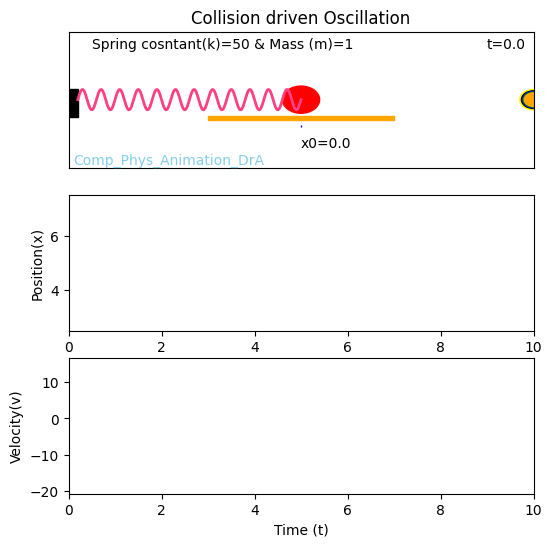

In [2]:
fig, (ax1, ax2, ax3) = plt.subplots(3, 1, figsize=(6, 6))


ax1.set_title("Collision driven Oscillation")
# ----- AXIS 1 : SPRING + MASS -----
ax1.set_xlim(0, 10)
#ax1.set_xlabel("Position(x)")
ax1.set_ylim(0, 4)
ax1.set_xticks([])
ax1.set_yticks([])

# Mass
cer = Circle((x_mass[0], 2), radius=r_spring, color="red")
ax1.add_patch(cer)

# Spring (line)
spring_line, = ax1.plot([], [], lw=2, color="#FF4081")
row= Rectangle((5, 1.2), 0.2, 0.05, color="blue")
plane= Rectangle((3, 1.4), 4, 0.13, color="orange")
text=ax1.text(6, 0.6, '')
text_t=ax1.text(9, 3.5, '')

text_abhi=ax1.text(.1, 0.1,'Comp_Phys_Animation_DrA', color="skyblue")
text1=ax1.text(0.5, 3.5, 'Spring cosntant(k)=50 & Mass (m)=1')
# Wall
wall = Rectangle((0, 1.5), 0.2, 0.8, color="black")
bullet1=Circle((x_bullet_spring1[0], 2), radius=r[1], color="yellow")
bullet2=Circle((x_bullet_spring2[0], 2), radius=r[2], color="black")
bullet3=Circle((x_bullet_spring3[0], 2), radius=r[3], color="blue")
bullet4=Circle((x_bullet_spring4[0], 2), radius=r[4], color="green")
bullet5=Circle((x_bullet_spring5[0], 2), radius=r[5], color="orange")
'''
bullet6=Circle((x_bullet_spring6[0], 2), radius=r[6], color="blue")
bullet7=Circle((x_bullet_spring7[0], 2), radius=r[7], color="yellow")
bullet8=Circle((x_bullet_spring8[0], 2), radius=r[8], color="black")
bullet9=Circle((x_bullet_spring9[0], 2), radius=r[9], color="blue")
bullet10=Circle((x_bullet_spring10[0], 2), radius=r[10], color="blue")

'''
ax1.add_patch(wall)
ax1.add_patch(row)
ax1.add_patch(plane)
ax1.add_patch(bullet1)
ax1.add_patch(bullet2)
ax1.add_patch(bullet3)
ax1.add_patch(bullet4)
ax1.add_patch(bullet5)

'''
ax1.add_patch(bullet6)
ax1.add_patch(bullet7)
ax1.add_patch(bullet8)
ax1.add_patch(bullet9)
ax1.add_patch(bullet10)

'''
#ax1.add_patch(text)
# ----- AXIS 2 : POSITION vs TIME -----
ax2.set_xlim(0, 10)
ax2.set_ylim(2.5, 7.5)
line1, = ax2.plot([], [], lw=2,  color="red")
ax2.set_xlabel("Time (t)")
ax2.set_ylabel("Position(x)")

ax3.set_xlim(0, 10)
ax3.set_ylim(v_mass.min()-1, v_mass.max()+1)
line2, = ax3.plot([], [], lw=2,color="blue" )
ax3.set_xlabel("Time (t)")
ax3.set_ylabel("Velocity(v)")

# ----- UPDATE FUNCTION -----
def update(frame):
    # Update mass position
    cer.center = (x_mass[frame], 2)
    bullet1.center = (x_bullet_spring1[frame], 2)
    bullet2.center = (x_bullet_spring2[frame], 2)
    bullet3.center = (x_bullet_spring3[frame], 2)
    bullet4.center = (x_bullet_spring4[frame], 2)
    bullet5.center = (x_bullet_spring5[frame], 2)
    '''bullet6.center = (x_bullet_spring6[frame], 2)

    bullet7.center = (x_bullet_spring7[frame], 2)
    bullet8.center = (x_bullet_spring8[frame], 2)
    bullet9.center = (x_bullet_spring9[frame], 2)
    bullet10.center = (x_bullet_spring10[frame], 2)
    '''
    # Spring shape
    x_start = 0.2
    x_end = x_mass[frame]
    xs = np.linspace(x_start, x_end, 300)
    ys = 2 + 0.3*np.sin(2*np.pi*12*(xs-x_start)/(x_end-x_start))
    spring_line.set_data(xs, ys)

    # Plot x(t)
    line1.set_data(t[:frame], x_mass[:frame])
    row.set_width(x_mass[frame]-5)
    text.set_x(x_mass[frame])
    text.set_text(f'x0={round(5-x_mass[frame],1)}')
    text_t.set_text(f't={round(t[frame],1)}')
    line2.set_data(t[:frame], v_mass[:frame])

    return cer, spring_line, line1,line2, row, bullet1, bullet2, bullet3, bullet4, bullet5 #, bullet6, bullet7, bullet8, bullet9,bullet10

# ----- ANIMATION -----
ani = FuncAnimation(
    fig,
    update,
    frames=len(t),
    interval=50,
    blit=False
)
ani.embed_limit=300
HTML(ani.to_jshtml())